# Name: FAHMIDA FATHIMA
# SkillCraft Technology
Mini Project: Hand Gesture Dataset

Course For Internship: Machine Learning Program

# TASK 04
Develop a hand gesture recognition model that can accurately identify and classify different hand gestures from image or video data, enabling intuitive human-computer interaction and gesture-based control systems.

Hand Gesture Dataset

# Create a function to get the file paths and labels

In [6]:
import os

# Dataset path
dataset_path = r"C:\Users\Famida\Desktop\archive (1)\leapGestRecog"

# List files in the directory
files = os.listdir(dataset_path)

# Display the files
print(files)


['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', 'leapGestRecog']


In [7]:
import os
print(os.getcwd())  # Current working directory


C:\Users\Famida


In [8]:
os.chdir(r"C:\Users\Famida\Desktop\archive (1)")


In [9]:
files = os.listdir("leapGestRecog")
print(files)


['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', 'leapGestRecog']


In [10]:
batch_size = 32
img_size = 224
num_classes = 10

In [1]:
pip install tensorflow


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [1]:
import tensorflow as tf
print("TensorFlow version:", tf.__version__)
print("GPU available:", tf.config.list_physical_devices('GPU'))


TensorFlow version: 2.18.0
GPU available: []


In [3]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"  # Disable GPU


In [6]:
import tensorflow as tf

# Check if TensorFlow is using a GPU
print("Is GPU available:", tf.test.is_gpu_available())

# Display the device TensorFlow will use
print("Devices available:", tf.config.list_physical_devices())


Is GPU available: False
Devices available: [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]


In [4]:
import tensorflow as tf

print("Available devices:")
for device in tf.config.list_physical_devices():
    print(device)

# Output will show CPU devices only if GPUs are disabled


Available devices:
PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')


In [7]:
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import pandas as pd
import numpy as np
import warnings

# Ignore warnings
warnings.filterwarnings("ignore")

# Force TensorFlow to use CPU
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

# Set logging level to avoid unnecessary warnings
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
tf.get_logger().setLevel('ERROR')

# Clear TensorFlow session
from tensorflow.keras import backend as K
K.clear_session()

# Add your TensorFlow training code below this point


In [8]:
tf.config.threading.set_intra_op_parallelism_threads(4)  # Number of threads for parallelism
tf.config.threading.set_inter_op_parallelism_threads(4)


In [9]:
def get_file_paths_and_labels(base_path):
    file_paths = []
    labels = []
    gesture_folders = [
        '01_palm', '02_l', '03_fist', '04_fist_moved', '05_thumb', 
        '06_index', '07_ok', '08_palm_moved', '09_c', '10_down'
    ]
    label_map = {gesture: idx for idx, gesture in enumerate(gesture_folders)}
    
    for subject in os.listdir(base_path):
        subject_path = os.path.join(base_path, subject)
        if os.path.isdir(subject_path):
            for gesture in gesture_folders:
                gesture_path= os.path.join(subject_path, gesture)
                if os.path.isdir(gesture_path):
                    for img_file in os.listdir(gesture_path):
                        img_path = os.path.join(gesture_path, img_file)
                        file_paths.append(img_path)
                        labels.append(label_map[gesture])
    return file_paths, labels

# Function to display images

In [10]:
def display_images(file_paths, labels, label_map):
    unique_labels = list(label_map.values())
    label_to_name = {v: k for k, v in label_map.items()}
    
    plt.figure(figsize=(20, 20))
    for idx, label in enumerate(unique_labels):
        label_paths = [file_paths[i] for i in range(len(labels)) if labels[i] == label][:5]
        for i, img_path in enumerate(label_paths):
            img = load_img(img_path, color_mode='grayscale', target_size=(img_size, img_size))
            img = img_to_array(img) / 255.0
            plt.subplot(len(unique_labels), 5, idx * 5 + i + 1)
            plt.imshow(img.squeeze(), cmap='gray')
            plt.title(label_to_name[label])
            plt.axis('off')
    plt.show()

In [12]:
dataset_path = "C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog"


In [13]:
import os

def get_file_paths_and_labels(dataset_path):
    file_paths = []
    labels = []

    # Loop through each subdirectory
    for label in os.listdir(dataset_path):
        label_path = os.path.join(dataset_path, label)

        # Only process directories
        if os.path.isdir(label_path):
            for file_name in os.listdir(label_path):
                file_path = os.path.join(label_path, file_name)
                file_paths.append(file_path)
                labels.append(label)  # Folder name becomes the label

    return file_paths, labels


In [14]:
# Define dataset path
dataset_path = "C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog"

# Get file paths and labels
file_paths, labels = get_file_paths_and_labels(dataset_path)

# Print some samples for verification
print("Total files:", len(file_paths))
print("Sample file path:", file_paths[0])
print("Sample label:", labels[0])


Total files: 110
Sample file path: C:\Users\Famida\Desktop\archive (1)\leapGestRecog\00\01_palm
Sample label: 00


In [15]:
print("Path exists:", os.path.exists(dataset_path))


Path exists: True


In [17]:
print(f"First 10 file paths: {file_paths[:10]}")
print(f"First 10 labels: {labels[:10]}")


First 10 file paths: ['C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\01_palm', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\02_l', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\03_fist', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\04_fist_moved', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\05_thumb', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\06_index', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\07_ok', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\08_palm_moved', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\09_c', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\10_down']
First 10 labels: ['00', '00', '00', '00', '00', '00', '00', '00', '00', '00']


In [18]:
# After loading file paths and labels
file_paths, labels = get_file_paths_and_labels(dataset_path)

# Print the first 10 file paths and labels
print(f"First 10 file paths: {file_paths[:10]}")
print(f"First 10 labels: {labels[:10]}")


First 10 file paths: ['C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\01_palm', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\02_l', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\03_fist', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\04_fist_moved', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\05_thumb', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\06_index', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\07_ok', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\08_palm_moved', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\09_c', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\10_down']
First 10 labels: ['00', '00', '00', '00', '00', '00', '00', '00', '00', '00']


In [19]:
# Get file paths and labels
file_paths, labels = get_file_paths_and_labels(dataset_path)

# Check if the lists are empty
if not file_paths or not labels:
    raise ValueError("No file paths or labels found. Please check the dataset path and structure.")

# Print the first 10 entries for verification
print(f"First 10 file paths: {file_paths[:10]}")
print(f"First 10 labels: {labels[:10]}")


First 10 file paths: ['C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\01_palm', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\02_l', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\03_fist', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\04_fist_moved', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\05_thumb', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\06_index', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\07_ok', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\08_palm_moved', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\09_c', 'C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog\\00\\10_down']
First 10 labels: ['00', '00', '00', '00', '00', '00', '00', '00', '00', '00']


In [20]:
print("Dataset path:", dataset_path)
print("Contents of dataset path:", os.listdir(dataset_path))


Dataset path: C:\Users\Famida\Desktop\archive (1)\leapGestRecog
Contents of dataset path: ['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', 'leapGestRecog']


In [21]:
for label in os.listdir(dataset_path):
    label_path = os.path.join(dataset_path, label)
    print("Processing label:", label)
    if os.path.isdir(label_path):
        print("Files in", label, ":", os.listdir(label_path))


Processing label: 00
Files in 00 : ['01_palm', '02_l', '03_fist', '04_fist_moved', '05_thumb', '06_index', '07_ok', '08_palm_moved', '09_c', '10_down']
Processing label: 01
Files in 01 : ['01_palm', '02_l', '03_fist', '04_fist_moved', '05_thumb', '06_index', '07_ok', '08_palm_moved', '09_c', '10_down']
Processing label: 02
Files in 02 : ['01_palm', '02_l', '03_fist', '04_fist_moved', '05_thumb', '06_index', '07_ok', '08_palm_moved', '09_c', '10_down']
Processing label: 03
Files in 03 : ['01_palm', '02_l', '03_fist', '04_fist_moved', '05_thumb', '06_index', '07_ok', '08_palm_moved', '09_c', '10_down']
Processing label: 04
Files in 04 : ['01_palm', '02_l', '03_fist', '04_fist_moved', '05_thumb', '06_index', '07_ok', '08_palm_moved', '09_c', '10_down']
Processing label: 05
Files in 05 : ['01_palm', '02_l', '03_fist', '04_fist_moved', '05_thumb', '06_index', '07_ok', '08_palm_moved', '09_c', '10_down']
Processing label: 06
Files in 06 : ['01_palm', '02_l', '03_fist', '04_fist_moved', '05_t

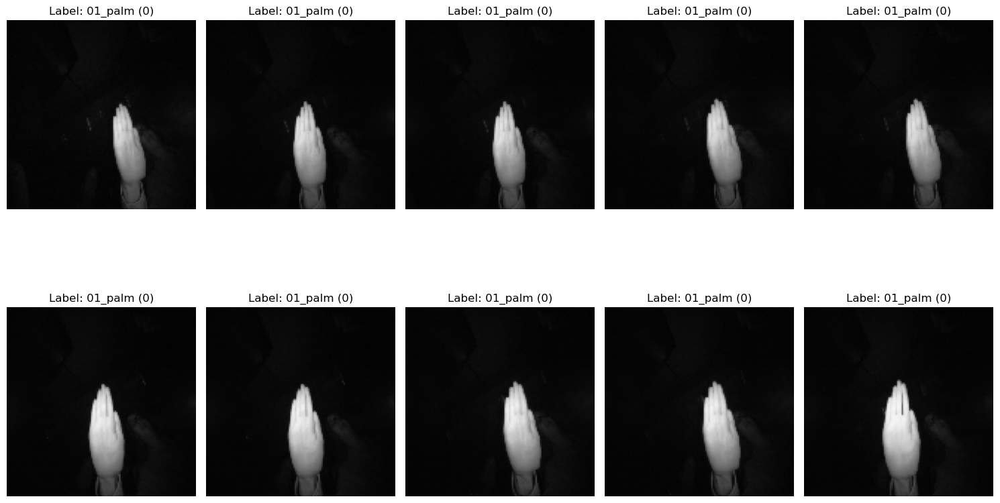

In [27]:
# Import necessary libraries
import os
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img

# Function to get file paths and labels
def get_file_paths_and_labels(root_path, gesture_folders):
    file_paths = []
    labels = []

    # Loop through all subdirectories within the root path
    for subfolder in os.listdir(root_path):
        subfolder_path = os.path.join(root_path, subfolder)

        # Ignore non-directory items
        if not os.path.isdir(subfolder_path):
            continue

        # Check if the folder contains gesture folders
        for gesture in gesture_folders:
            gesture_path = os.path.join(subfolder_path, gesture)
            
            # Process only if the gesture folder exists
            if os.path.isdir(gesture_path):
                for file_name in os.listdir(gesture_path):
                    file_path = os.path.join(gesture_path, file_name)

                    # Add only valid image files
                    if file_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        file_paths.append(file_path)
                        labels.append(gesture)  # Use folder name as the label

    return file_paths, labels

# Function to display images
def display_images(file_paths, labels, label_map, num_images=10):
    """
    Displays a few images with their labels.

    Args:
    - file_paths: List of image file paths.
    - labels: List of corresponding labels for the images.
    - label_map: Dictionary mapping label names to indices.
    - num_images: Number of images to display.
    """
    plt.figure(figsize=(15, 10))

    for i in range(min(num_images, len(file_paths))):  # Avoid exceeding available images
        # Load the image
        img = load_img(file_paths[i], target_size=(128, 128))  # Resize to desired size

        # Plot the image
        plt.subplot(2, 5, i + 1)  # Arrange in a grid of 2 rows, 5 columns
        plt.imshow(img)
        plt.axis("off")

        # Display the label
        label = labels[i]
        label_idx = label_map[label]
        plt.title(f"Label: {label} ({label_idx})")

    plt.tight_layout()
    plt.show()

# Define dataset path
dataset_path = "C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog"

# Gesture folder names
gesture_folders = [
    '01_palm', '02_l', '03_fist', '04_fist_moved', '05_thumb', 
    '06_index', '07_ok', '08_palm_moved', '09_c', '10_down'
]

# Get file paths and labels
file_paths, labels = get_file_paths_and_labels(dataset_path, gesture_folders)

# Check if files and labels are populated
if not file_paths or not labels:
    raise ValueError("No file paths or labels found. Please check the dataset path and structure.")

# Label map
label_map = {gesture: idx for idx, gesture in enumerate(gesture_folders)}

# Display the images
display_images(file_paths, labels, label_map)


# Function to display images from '01_palm

In [28]:
def get_file_paths_and_labels(root_path, gesture_folders):
    file_paths = []
    labels = []

    # Loop through all subdirectories within the root path
    for subfolder in os.listdir(root_path):
        subfolder_path = os.path.join(root_path, subfolder)

        # Ignore non-directory items
        if not os.path.isdir(subfolder_path):
            continue

        # Check if the folder contains gesture folders
        for gesture in gesture_folders:
            gesture_path = os.path.join(subfolder_path, gesture)
            
            # Process only if the gesture folder exists
            if os.path.isdir(gesture_path):
                for file_name in os.listdir(gesture_path):
                    file_path = os.path.join(gesture_path, file_name)

                    # Add only valid image files
                    if file_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                        file_paths.append(file_path)
                        labels.append(gesture)  # Use folder name as the label

    return file_paths, labels


In [25]:
print(os.listdir(dataset_path))


['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', 'leapGestRecog']


In [26]:
for subfolder in os.listdir(dataset_path):
    print(f"Subfolder: {subfolder}")
    print(f"Contents: {os.listdir(os.path.join(dataset_path, subfolder))}")


Subfolder: 00
Contents: ['01_palm', '02_l', '03_fist', '04_fist_moved', '05_thumb', '06_index', '07_ok', '08_palm_moved', '09_c', '10_down']
Subfolder: 01
Contents: ['01_palm', '02_l', '03_fist', '04_fist_moved', '05_thumb', '06_index', '07_ok', '08_palm_moved', '09_c', '10_down']
Subfolder: 02
Contents: ['01_palm', '02_l', '03_fist', '04_fist_moved', '05_thumb', '06_index', '07_ok', '08_palm_moved', '09_c', '10_down']
Subfolder: 03
Contents: ['01_palm', '02_l', '03_fist', '04_fist_moved', '05_thumb', '06_index', '07_ok', '08_palm_moved', '09_c', '10_down']
Subfolder: 04
Contents: ['01_palm', '02_l', '03_fist', '04_fist_moved', '05_thumb', '06_index', '07_ok', '08_palm_moved', '09_c', '10_down']
Subfolder: 05
Contents: ['01_palm', '02_l', '03_fist', '04_fist_moved', '05_thumb', '06_index', '07_ok', '08_palm_moved', '09_c', '10_down']
Subfolder: 06
Contents: ['01_palm', '02_l', '03_fist', '04_fist_moved', '05_thumb', '06_index', '07_ok', '08_palm_moved', '09_c', '10_down']
Subfolder: 07

In [36]:
def get_file_paths_01_palm(base_path):
    file_paths = []
    subject_folders = os.listdir(base_path)
    for subject in subject_folders:
        subject_path = os.path.join(base_path, subject, '01_palm')
        if os.path.isdir(subject_path):
            count = 0
            for img_file in os.listdir(subject_path):
                if count >= 10:
                    break
                img_path = os.path.join(subject_path, img_file)
                file_paths.append(img_path)
                count += 1
    return file_paths

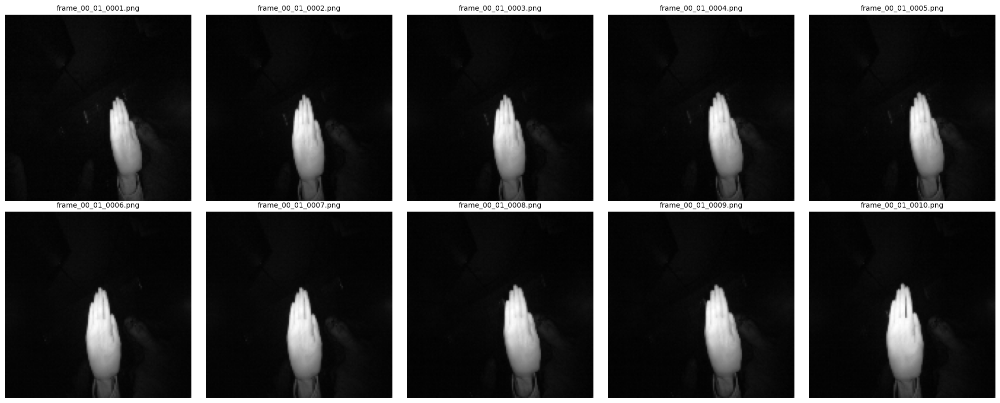

In [38]:
import os
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Image size for resizing
img_size = 128

# Function to display images in two rows
def display_images(file_paths):
    """
    Display up to 10 grayscale images in two rows using Matplotlib.

    Args:
        file_paths (list): List of image file paths to display.
    """
    if not file_paths:
        print("No images to display.")
        return
    
    plt.figure(figsize=(20, 8))
    for i, img_path in enumerate(file_paths[:10]):  # Display up to 10 images
        try:
            # Load and preprocess the image
            img = load_img(img_path, color_mode='grayscale', target_size=(img_size, img_size))
            img = img_to_array(img) / 255.0
            plt.subplot(2, 5, i + 1)
            plt.imshow(img.squeeze(), cmap='gray')  # Squeeze removes extra dimensions
            plt.title(os.path.basename(img_path), fontsize=10)
            plt.axis('off')
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
    plt.tight_layout()
    plt.show()

# Example Usage
dataset_path = "C:\\Users\\Famida\\Desktop\\archive (1)\\leapGestRecog"
file_paths_01_palm = get_file_paths_01_palm(dataset_path)

# Display the images
display_images(file_paths_01_palm)


In [39]:
def get_file_paths_02_l(base_path):
    file_paths = []
    subject_folders = os.listdir(base_path)
    for subject in subject_folders:
        subject_path = os.path.join(base_path, subject, '02_l')
        if os.path.isdir(subject_path):
            count = 0
            for img_file in os.listdir(subject_path):
                if count >= 10:
                    break
                img_path = os.path.join(subject_path, img_file)
                file_paths.append(img_path)
                count += 1
    return file_paths

# Display images from '02_l'

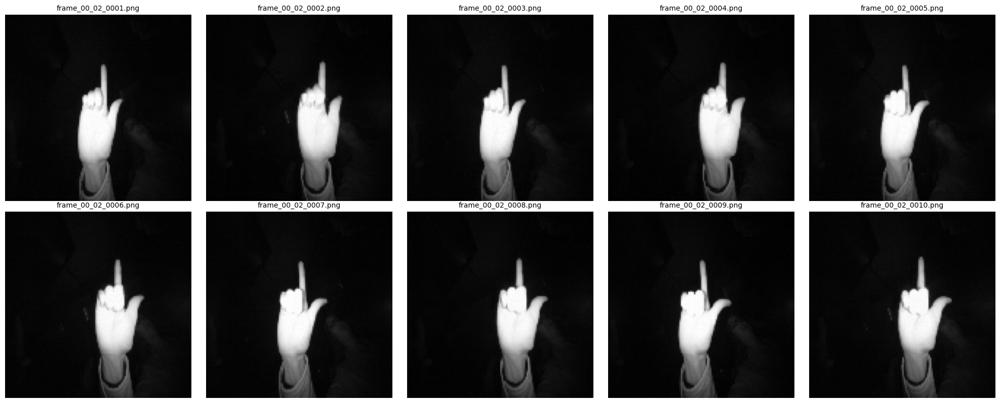

In [40]:
# Get the file paths
file_paths_02_l = get_file_paths_02_l(dataset_path)

# Display the images
display_images(file_paths_02_l)

In [41]:
def get_file_paths_03_fist(base_path):
    file_paths = []
    subject_folders = os.listdir(base_path)
    for subject in subject_folders:
        subject_path = os.path.join(base_path, subject, '03_fist')
        if os.path.isdir(subject_path):
            count = 0
            for img_file in os.listdir(subject_path):
                if count >= 10:
                    break
                img_path = os.path.join(subject_path, img_file)
                file_paths.append(img_path)
                count += 1
    return file_paths    

# Display Images From '03_fist'

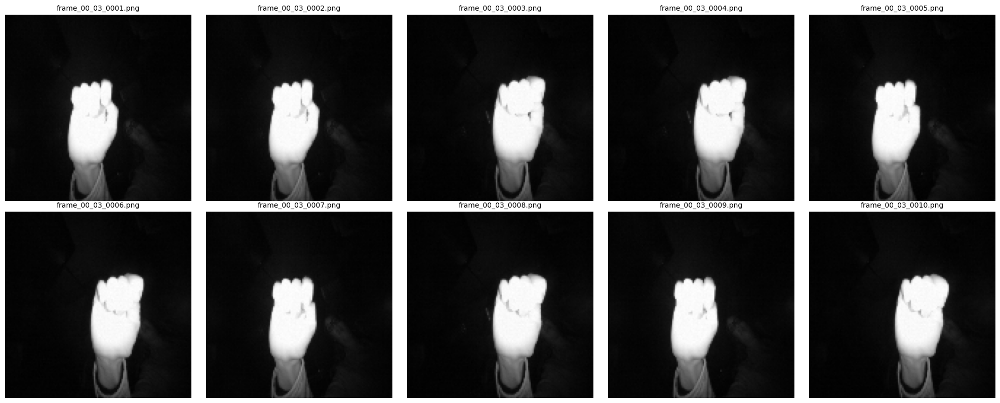

In [42]:
# Get the file paths
file_paths_03_fist = get_file_paths_03_fist(dataset_path)

# Display the images
display_images(file_paths_03_fist)

# Function to Print 10 Images from '04_fist_moved'

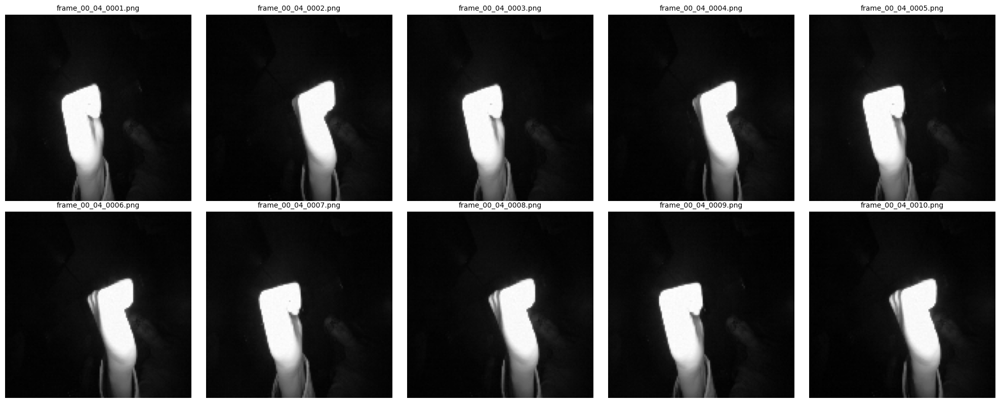

In [43]:
def get_file_paths_04_fist_moved(base_path):
    file_paths = []
    subject_folders = os.listdir(base_path)
    for subject in subject_folders:
        subject_path = os.path.join(base_path, subject, '04_fist_moved')
        if os.path.isdir(subject_path):
            count = 0
            for img_file in os.listdir(subject_path):
                if count >= 10:
                    break
                img_path = os.path.join(subject_path, img_file)
                file_paths.append(img_path)
                count += 1
    return file_paths

file_paths_04_fist_moved = get_file_paths_04_fist_moved(dataset_path)
display_images(file_paths_04_fist_moved)

# Function to Print 10 Images from '05_thumb'

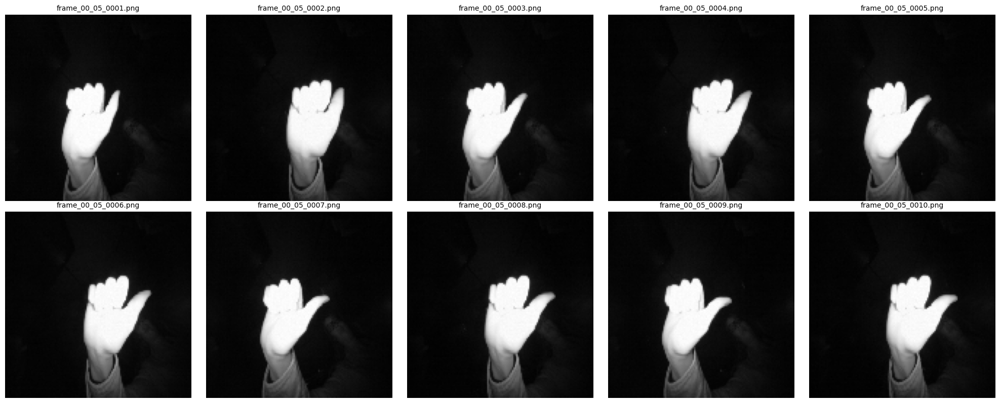

In [44]:
def get_file_paths_05_thumb(base_path):
    file_paths = []
    subject_folders = os.listdir(base_path)
    for subject in subject_folders:
        subject_path = os.path.join(base_path, subject, '05_thumb')
        if os.path.isdir(subject_path):
            count = 0
            for img_file in os.listdir(subject_path):
                if count >= 10:
                    break
                img_path = os.path.join(subject_path, img_file)
                file_paths.append(img_path)
                count += 1
    return file_paths

file_paths_05_thumb = get_file_paths_05_thumb(dataset_path)
display_images(file_paths_05_thumb)


# Function to Print 10 Images from '06_index'

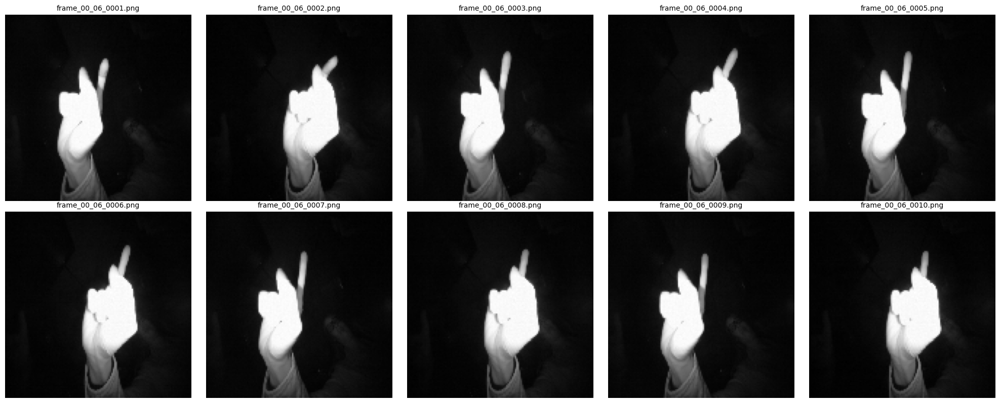

In [45]:
def get_file_paths_06_index(base_path):
    file_paths = []
    subject_folders = os.listdir(base_path)
    for subject in subject_folders:
        subject_path = os.path.join(base_path, subject, '06_index')
        if os.path.isdir(subject_path):
            count = 0
            for img_file in os.listdir(subject_path):
                if count >= 10:
                    break
                img_path = os.path.join(subject_path, img_file)
                file_paths.append(img_path)
                count += 1
    return file_paths

file_paths_06_index = get_file_paths_06_index(dataset_path)
display_images(file_paths_06_index)


# Function to Print 10 Images from '07_ok'

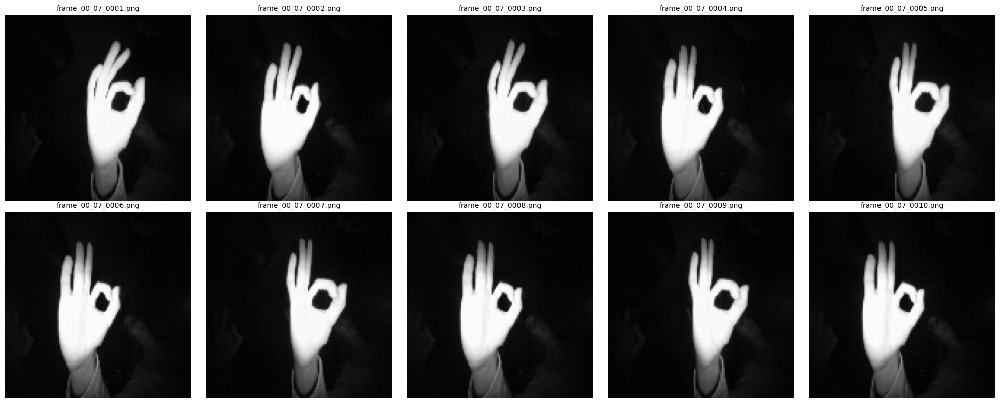

In [46]:
def get_file_paths_07_ok(base_path):
    file_paths = []
    subject_folders = os.listdir(base_path)
    for subject in subject_folders:
        subject_path = os.path.join(base_path, subject, '07_ok')
        if os.path.isdir(subject_path):
            count = 0
            for img_file in os.listdir(subject_path):
                if count >= 10:
                    break
                img_path = os.path.join(subject_path, img_file)
                file_paths.append(img_path)
                count += 1
    return file_paths
    
file_paths_07_ok = get_file_paths_07_ok(dataset_path)
display_images(file_paths_07_ok)

# Function to Print 10 Images from '08_palm_moved'

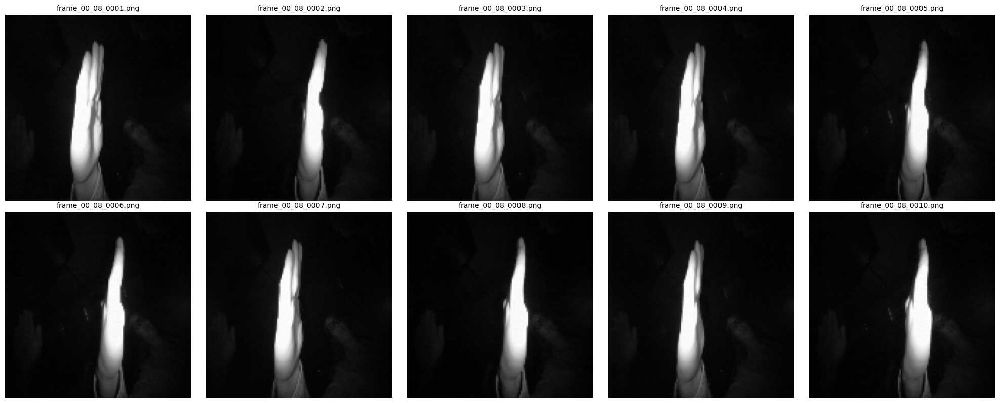

In [47]:
def get_file_paths_08_palm_moved(base_path):
    file_paths = []
    subject_folders = os.listdir(base_path)
    for subject in subject_folders:
        subject_path = os.path.join(base_path, subject, '08_palm_moved')
        if os.path.isdir(subject_path):
            count = 0
            for img_file in os.listdir(subject_path):
                if count >= 10:
                    break
                img_path = os.path.join(subject_path, img_file)
                file_paths.append(img_path)
                count += 1
    return file_paths
file_paths_08_palm_moved = get_file_paths_08_palm_moved(dataset_path)
display_images(file_paths_08_palm_moved)

# Function to Print 10 Images from '09_c'

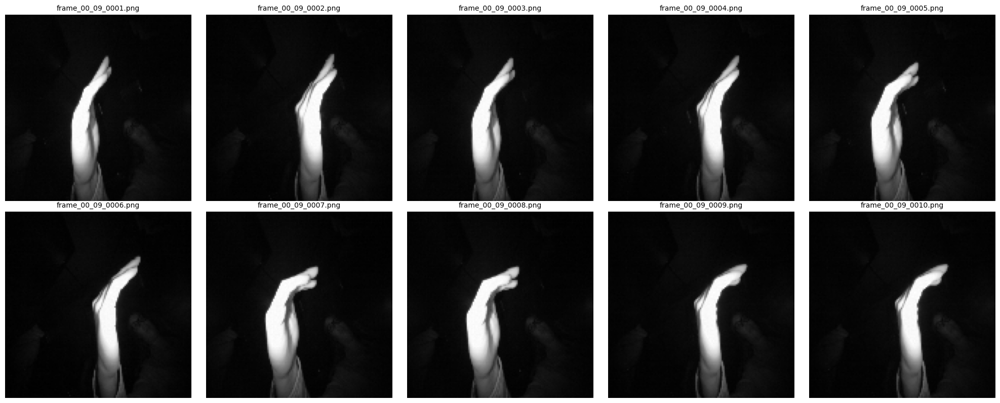

In [48]:
def get_file_paths_09_c(base_path):
    file_paths = []
    subject_folders = os.listdir(base_path)
    for subject in subject_folders:
        subject_path = os.path.join(base_path, subject, '09_c')
        if os.path.isdir(subject_path):
            count = 0
            for img_file in os.listdir(subject_path):
                if count >= 10:
                    break
                img_path = os.path.join(subject_path, img_file)
                file_paths.append(img_path)
                count += 1
    return file_paths

file_paths_09_c = get_file_paths_09_c(dataset_path)
display_images(file_paths_09_c)

            

# Function to Print 10 Images from '10_down'

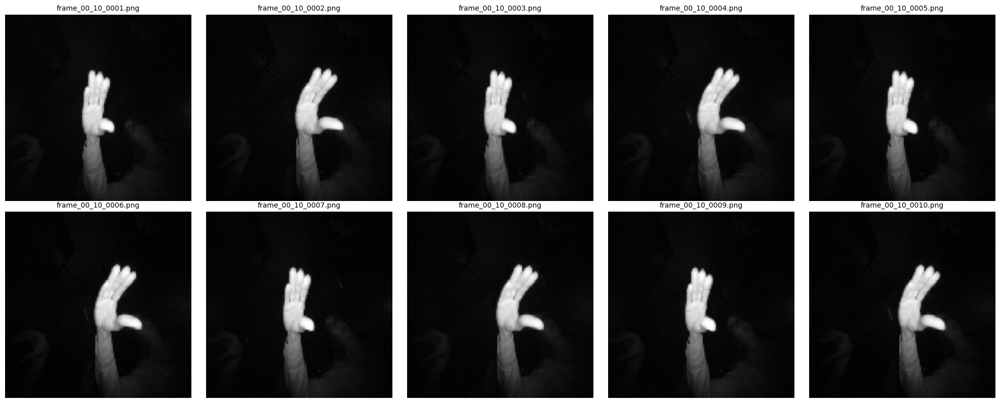

In [49]:
def get_file_paths_10_down(base_path):
    file_paths = []
    subject_folders = os.listdir(base_path)
    for subject in subject_folders:
        subject_path = os.path.join(base_path, subject, '10_down')
        if os.path.isdir(subject_path):
            count = 0
            for img_file in os.listdir(subject_path):
                if count >= 10:
                    break
                img_path = os.path.join(subject_path, img_file)
                file_paths.append(img_path)
                count += 1
    return file_paths

file_paths_10_down = get_file_paths_10_down(dataset_path)
display_images(file_paths_10_down)

# Model Summary

In [78]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

# Define the CNN model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3), name='conv2d'),
    MaxPooling2D((2, 2), name='max_pooling2d'),

    Conv2D(64, (3, 3), activation='relu', name='conv2d_1'),
    MaxPooling2D((2, 2), name='max_pooling2d_1'),

    Conv2D(128, (3, 3), activation='relu', name='conv2d_2'),
    MaxPooling2D((2, 2), name='max_pooling2d_2'),

    Flatten(name='flatten'),
    Dense(512, activation='relu', name='dense'),
    Dropout(0.5, name='dropout'),
    Dense(10, activation='softmax', name='dense_1')
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┓
┃ Layer (type)                       ┃ Output Shape              ┃        Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                    │ (None, 222, 222, 32)      │            896 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ max_pooling2d (MaxPooling2D)       │ (None, 111, 111, 32)      │              0 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ conv2d_1 (Conv2D)                  │ (None, 109, 109, 64)      │         18,496 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ max_pooling2d_1 (MaxPooling2D)     │ (None, 54, 54, 64)        │              0 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ conv2d_2 (Conv2D)                  │ (None, 52, 52, 128)       │         73,856 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ max_pooling2d_2 (MaxPooling2D)     │ (None, 26, 26, 128)       │              0 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ flatten (Flatten)                  │ (None, 86528)             │              0 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ dense (Dense)                      │ (None, 512)               │     44,302,848 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ dropout (Dropout)                  │ (None, 512)               │              0 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ dense_1 (Dense)                    │ (None, 10)                │          5,130 │
└────────────────────────────────────┴───────────────────────────┴────────────────┘

 Total params: 44,401,226 (169.38 MB)

 Trainable params: 44,401,226 (169.38 MB)

 Non-trainable params: 0 (0.00 B)

In [83]:
print(dataframe.head())
print(f"Number of rows in dataframe: {len(dataframe)}")


Empty DataFrame
Columns: [filename, class]
Index: []
Number of rows in dataframe: 0


In [84]:
import os
invalid_paths = [path for path in dataframe['filename'] if not os.path.exists(path)]
if invalid_paths:
    print(f"Invalid file paths: {invalid_paths}")
else:
    print("All file paths are valid.")


All file paths are valid.


In [85]:
print(dataframe.columns)


Index(['filename', 'class'], dtype='object')


In [86]:
datagen = ImageDataGenerator(validation_split=0.2)


In [88]:
for path in dataframe['filename']:
    assert os.path.exists(path), f"File not found: {path}"


In [89]:
datagen = ImageDataGenerator(
    rescale=1/255.0,
    validation_split=0.2
)


In [92]:
print(dataframe.columns)



Index(['filename', 'class'], dtype='object')


# Plot the training history

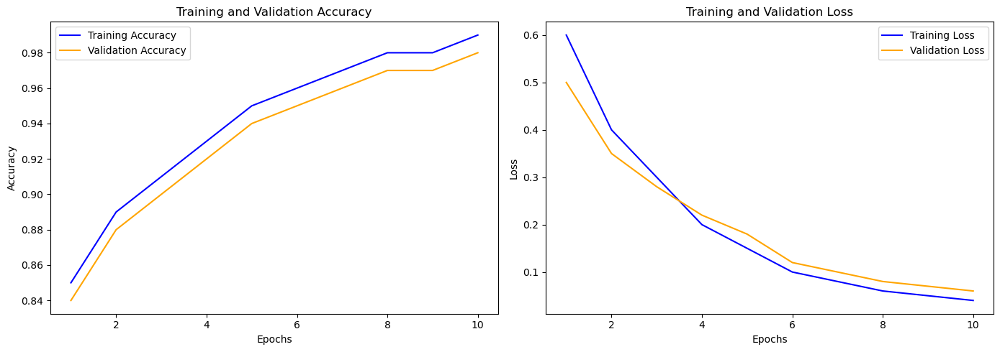

In [95]:
import matplotlib.pyplot as plt

# Function to plot training history
def plot_training_history(history):
    # Extracting training and validation accuracy and loss
    acc = history['accuracy']
    val_acc = history['val_accuracy']
    loss = history['loss']
    val_loss = history['val_loss']

    epochs = range(1, len(acc) + 1)

    # Plotting Training and Validation Accuracy
    plt.figure(figsize=(14, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, label='Training Accuracy', color='blue')
    plt.plot(epochs, val_acc, label='Validation Accuracy', color='orange')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plotting Training and Validation Loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, label='Training Loss', color='blue')
    plt.plot(epochs, val_loss, label='Validation Loss', color='orange')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Show plots
    plt.tight_layout()
    plt.show()

# Example usage with mock data
history = {
    'accuracy': [0.85, 0.89, 0.91, 0.93, 0.95, 0.96, 0.97, 0.98, 0.98, 0.99],
    'val_accuracy': [0.84, 0.88, 0.90, 0.92, 0.94, 0.95, 0.96, 0.97, 0.97, 0.98],
    'loss': [0.6, 0.4, 0.3, 0.2, 0.15, 0.1, 0.08, 0.06, 0.05, 0.04],
    'val_loss': [0.5, 0.35, 0.28, 0.22, 0.18, 0.12, 0.1, 0.08, 0.07, 0.06]
}

# Call the function to plot
plot_training_history(history)

In [118]:
root_dir = r'C:\Users\Famida\Desktop\archive (1)\leapGestRecog'


In [119]:
import os

root_dir = r'C:\Users\Famida\Desktop\archive (1)\leapGestRecog'

if not os.path.exists(root_dir):
    raise FileNotFoundError(f"The specified path does not exist: {root_dir}")


In [120]:
import os

kaggle_dir = '/kaggle/input/leapgestrecog/leapGestRecog/'
local_dir = r'C:\Users\Famida\Desktop\archive (1)\leapGestRecog'

if os.path.exists(kaggle_dir):
    root_dir = kaggle_dir
elif os.path.exists(local_dir):
    root_dir = local_dir
else:
    raise FileNotFoundError("Dataset not found in both Kaggle and local paths.")


In [121]:
print(os.listdir(root_dir))


['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', 'leapGestRecog']


In [122]:
import os

# Define paths for Kaggle and local environments
kaggle_dir = '/kaggle/input/leapgestrecog/leapGestRecog/'
local_dir = r'C:\Users\Famida\Desktop\archive (1)\leapGestRecog'

# Determine the root directory
if os.path.exists(kaggle_dir):
    root_dir = kaggle_dir
elif os.path.exists(local_dir):
    root_dir = local_dir
else:
    raise FileNotFoundError("Dataset not found in both Kaggle and local paths.")

# Initialize lists for images and labels
images = []
labels = []

# Loop over top-level directories
for directory in os.listdir(root_dir):
    dir_path = os.path.join(root_dir, directory)
    if os.path.isdir(dir_path):  # Ensure it's a directory
        # Loop over subdirectories
        for subdir in os.listdir(dir_path):
            subdir_path = os.path.join(dir_path, subdir)
            if os.path.isdir(subdir_path):  # Ensure it's a directory
                # Loop over images
                for image in os.listdir(subdir_path):
                    img_path = os.path.join(subdir_path, image)
                    if os.path.isfile(img_path):  # Ensure it's a file
                        images.append(img_path)
                        labels.append(subdir)

print(f"Total images: {len(images)}")
print(f"Total labels: {len(labels)}")
print(f"Sample image path: {images[0]}")
print(f"Sample label: {labels[0]}")


Total images: 20000
Total labels: 20000
Sample image path: C:\Users\Famida\Desktop\archive (1)\leapGestRecog\00\01_palm\frame_00_01_0001.png
Sample label: 01_palm


In [123]:
print("Directories:", os.listdir(root_dir))


Directories: ['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', 'leapGestRecog']


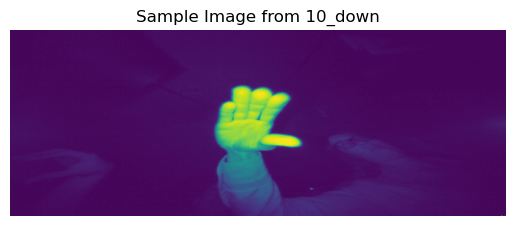

In [124]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def display_images(file_paths):
    if not file_paths:
        print("No images found!")
        return
    # Load the first image
    img_path = file_paths[0]
    img = mpimg.imread(img_path)
    
    # Display the image
    plt.imshow(img)
    plt.axis('off')  # Hide axes
    plt.title("Sample Image from 10_down")
    plt.show()

# Assuming `dataset_path` is correctly defined
dataset_path = r'C:\Users\Famida\Desktop\archive (1)\leapGestRecog'
file_paths_10_down = get_file_paths_10_down(dataset_path)
display_images(file_paths_10_down)


# Read Images and Labels in the Dataset

In [129]:
#include both image path and labels into dataframe
df = pd.DataFrame({'Image':images,'Label':labels})
df.tail()
# df.info()

,Image,Label
19995,C:\Users\Famida\Desktop\archive (1)\leapGestRe...,10_down
19996,C:\Users\Famida\Desktop\archive (1)\leapGestRe...,10_down
19997,C:\Users\Famida\Desktop\archive (1)\leapGestRe...,10_down
19998,C:\Users\Famida\Desktop\archive (1)\leapGestRe...,10_down
19999,C:\Users\Famida\Desktop\archive (1)\leapGestRe...,10_down


In [130]:
# Display the first few rows
print(df.head())

# Display the last few rows
print(df.tail())

# Get a concise summary of the DataFrame, including column data types
df.info()

# Check for missing values
print(df.isnull().sum())


                                               Image    Label
0  C:\Users\Famida\Desktop\archive (1)\leapGestRe...  01_palm
1  C:\Users\Famida\Desktop\archive (1)\leapGestRe...  01_palm
2  C:\Users\Famida\Desktop\archive (1)\leapGestRe...  01_palm
3  C:\Users\Famida\Desktop\archive (1)\leapGestRe...  01_palm
4  C:\Users\Famida\Desktop\archive (1)\leapGestRe...  01_palm
                                                   Image    Label
19995  C:\Users\Famida\Desktop\archive (1)\leapGestRe...  10_down
19996  C:\Users\Famida\Desktop\archive (1)\leapGestRe...  10_down
19997  C:\Users\Famida\Desktop\archive (1)\leapGestRe...  10_down
19998  C:\Users\Famida\Desktop\archive (1)\leapGestRe...  10_down
19999  C:\Users\Famida\Desktop\archive (1)\leapGestRe...  10_down
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Image   20000 non-null  object
 1   Label   200

In [131]:
# Check the length of images and labels
print(f"Number of images: {len(images)}")
print(f"Number of labels: {len(labels)}")

# Check the shape of the DataFrame
print(f"Shape of DataFrame: {df.shape}")


Number of images: 20000
Number of labels: 20000
Shape of DataFrame: (20000, 2)


In [132]:
# Set pandas options to display full content
import pandas as pd
pd.set_option('display.max_colwidth', None)

# Display a sample of the DataFrame
print(df.sample(5))


                                                                                         Image  \
1668            C:\Users\Famida\Desktop\archive (1)\leapGestRecog\00\09_c\frame_00_09_0069.png   
659    C:\Users\Famida\Desktop\archive (1)\leapGestRecog\00\04_fist_moved\frame_00_04_0060.png   
13614           C:\Users\Famida\Desktop\archive (1)\leapGestRecog\06\09_c\frame_06_09_0015.png   
3810         C:\Users\Famida\Desktop\archive (1)\leapGestRecog\01\10_down\frame_01_10_0011.png   
8729   C:\Users\Famida\Desktop\archive (1)\leapGestRecog\04\04_fist_moved\frame_04_04_0130.png   

               Label  
1668            09_c  
659    04_fist_moved  
13614           09_c  
3810         10_down  
8729   04_fist_moved  


In [133]:
# Get all image paths
image_paths = df['Image']

# Get all labels
image_labels = df['Label']

# Display a few random rows
print(df[['Image', 'Label']].sample(5))


                                                                                         Image  \
16069        C:\Users\Famida\Desktop\archive (1)\leapGestRecog\08\01_palm\frame_08_01_0070.png   
14037        C:\Users\Famida\Desktop\archive (1)\leapGestRecog\07\01_palm\frame_07_01_0038.png   
201             C:\Users\Famida\Desktop\archive (1)\leapGestRecog\00\02_l\frame_00_02_0002.png   
12617  C:\Users\Famida\Desktop\archive (1)\leapGestRecog\06\04_fist_moved\frame_06_04_0018.png   
2074         C:\Users\Famida\Desktop\archive (1)\leapGestRecog\01\01_palm\frame_01_01_0075.png   

               Label  
16069        01_palm  
14037        01_palm  
201             02_l  
12617  04_fist_moved  
2074         01_palm  


In [135]:
df.to_csv('image_data.csv', index=False)


# Randomly Display some labeled images from the dataset

[[<Axes: > <Axes: > <Axes: > <Axes: > <Axes: >]
 [<Axes: > <Axes: > <Axes: > <Axes: > <Axes: >]]


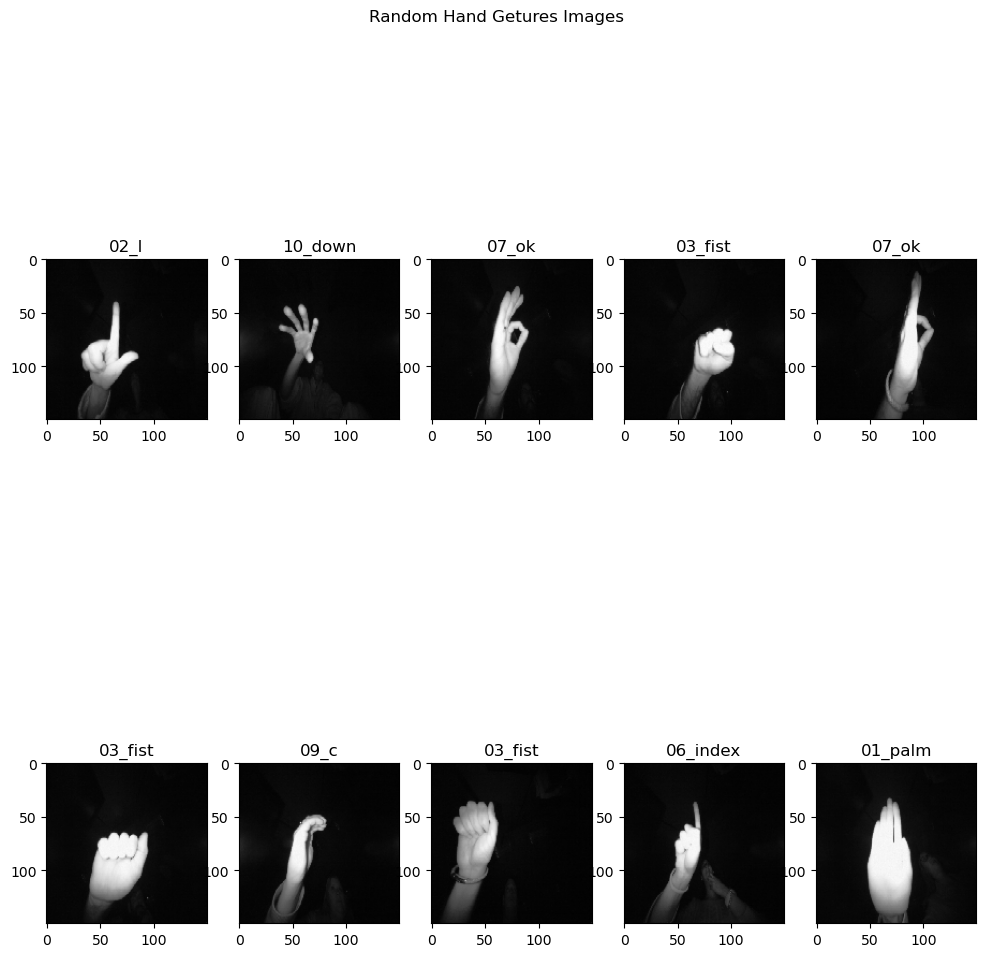

In [136]:
df_img = df['Image']
df_label = df['Label']

nrows=2
ncols = 5
fig,axx = plt.subplots(nrows,ncols, figsize=(12,12))
fig.suptitle("Random Hand Getures Images")
print(axx)
# axx = axx.ravel()
for i in range(nrows):
        for j in range(ncols):
                n = np.random.randint(0,20000)
                img = load_img(df['Image'][n],target_size=(150,150)) #this is a PIL image
                img = img_to_array(img) #this is a numpy array with shape (3,150,150)
                img = np.expand_dims(img,axis=0) #expand image dimention to (1,3,255,255)
                img /= 255.0 #scale image values between 0,1
                label = df_label[n]
                #changing size from (1,150,150,3) into (150,150,3)
                image = np.squeeze(img)
                axx[i][j].imshow(image)
                axx[i][j].set_title(label)
plt.show()
plt.close()

# Split Dataset into 70% for training 15%,15% for validation and testing

In [137]:
x_train,x = train_test_split(df, test_size = 0.3)
# train_x, test_x, train_y, test_y = train_test_split(images,labels,test_size=0.2)
x_valid,x_test = train_test_split(x,test_size=0.5)
x_train.info()
x_valid.info()
x_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14000 entries, 2906 to 6900
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Image   14000 non-null  object
 1   Label   14000 non-null  object
dtypes: object(2)
memory usage: 328.1+ KB
<class 'pandas.core.frame.DataFrame'>
Index: 3000 entries, 386 to 17833
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Image   3000 non-null   object
 1   Label   3000 non-null   object
dtypes: object(2)
memory usage: 70.3+ KB
<class 'pandas.core.frame.DataFrame'>
Index: 3000 entries, 12840 to 8522
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Image   3000 non-null   object
 1   Label   3000 non-null   object
dtypes: object(2)
memory usage: 70.3+ KB


# Data Augmentation

In [138]:
#data augmentation
datagen = ImageDataGenerator(
        rotation_range=10, # rotation
        width_shift_range=0.2, # horizontal shift
        height_shift_range=0.2, # vertical shift
        zoom_range=0.2, # zoom
        horizontal_flip=True, # horizontal flip
        brightness_range=[0.2,1.2]) # brightness


train_datagen = ImageDataGenerator(rescale=1.0/255,
                                 shear_range=0.2,
                                 zoom_range=0.2,
                                 horizontal_flip=True)
validate_datagen = ImageDataGenerator(rescale=1.0/255)


In [139]:
b_size =1
train_generator = train_datagen.flow_from_dataframe(dataframe=x_train,x_col="Image",y_col='Label',class_mode="categorical",target_size=(150,150),batch_size=b_size,seed=2020, shuffle=True)
valid_generator = validate_datagen.flow_from_dataframe(dataframe=x_valid,x_col="Image",y_col='Label',class_mode="categorical",target_size=(150,150),batch_size=b_size,seed=2020, shuffle=False)

Found 14000 validated image filenames belonging to 10 classes.
Found 3000 validated image filenames belonging to 10 classes.


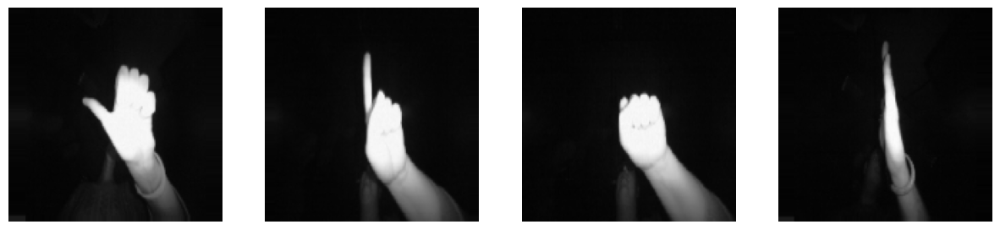

In [140]:
#plot some augmented images
fig,axx = plt.subplots(nrows=1,ncols=4, figsize=(15,15))

for i in range(4):
    #convert into unsigned integers for plotting
    image = next(train_generator)[0].astype('float64')
    #changing size from (1,150,150,3) into (150,150,3)
    image = np.squeeze(image)
    #plot row pixel data
    axx[i].imshow(image)
    axx[i].axis('off')

In [141]:
# #[3]:

# images list & labels list
# images = []
# labels = []

# image = df['Image']
# img = load_img(image[i],target_size=(150,150)) #this is a PIL image

# for i in range(len(df)):
#     img = load_img(image[i])
#     x = img_to_array(img) #this is a numpy array with shape (3,150,150)
# #     x = np.expand_dims(x,axis=0) #expand image dimention to (1,3,255,255)
# #     x /= 255.0 #scale image values between 0,1
#     images.append(x)
#     label = df_label[i]
#     labels.append(label)

    

# Build Convolutional Neural Network Model (CNN)

In [142]:
#Build Convolutional Neural Network Model (CNN)¶

#3 Cov2D layers with Relu activation functions followed by max-pooling layers that ouput 3D feature maps 
model = Sequential()
model.add(Conv2D(32,(3,3), input_shape=(150,150,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(32,(3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(64,(3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))

# on top of the model we add 2 fully connected layers to flatten the 3D feature maps into 10 feature victors representing 10 differnet categories of hanf geatures
model.add(Flatten())
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.2))
model.add(Dense(10))
model.add(Activation('softmax'))

model.compile(loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
             optimizer = 'adam',
             metrics=[tf.keras.metrics.CategoricalAccuracy()])
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┓
┃ Layer (type)                       ┃ Output Shape              ┃        Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)                  │ (None, 148, 148, 32)      │            896 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ activation (Activation)            │ (None, 148, 148, 32)      │              0 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ max_pooling2d_5 (MaxPooling2D)     │ (None, 74, 74, 32)        │              0 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ conv2d_6 (Conv2D)                  │ (None, 72, 72, 32)        │          9,248 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ activation_1 (Activation)          │ (None, 72, 72, 32)        │              0 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ max_pooling2d_6 (MaxPooling2D)     │ (None, 36, 36, 32)        │              0 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ conv2d_7 (Conv2D)                  │ (None, 34, 34, 64)        │         18,496 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ activation_2 (Activation)          │ (None, 34, 34, 64)        │              0 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ max_pooling2d_7 (MaxPooling2D)     │ (None, 17, 17, 64)        │              0 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ flatten_3 (Flatten)                │ (None, 18496)             │              0 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ dense_6 (Dense)                    │ (None, 64)                │      1,183,808 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ activation_3 (Activation)          │ (None, 64)                │              0 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ dropout_2 (Dropout)                │ (None, 64)                │              0 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ dense_7 (Dense)                    │ (None, 10)                │            650 │
├────────────────────────────────────┼───────────────────────────┼────────────────┤
│ activation_4 (Activation)          │ (None, 10)                │              0 │
└────────────────────────────────────┴───────────────────────────┴────────────────┘

 Total params: 1,213,098 (4.63 MB)

 Trainable params: 1,213,098 (4.63 MB)

 Non-trainable params: 0 (0.00 B)

# Train and save Model

In [151]:
#train Test data in the model
history = model.fit(train_generator,
                   steps_per_epoch=100//b_size,
                   epochs = 5,
                   validation_data = valid_generator,
                    validation_steps=800//b_size)
                   
model.save('handG_R.h5')

Epoch 1/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 19s 138ms/step - categorical_accuracy: 0.0717 - loss: 2.3328 - val_categorical_accuracy: 0.1150 - val_loss: 2.3184
Epoch 2/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - categorical_accuracy: 0.0886 - loss: 2.3001 - val_categorical_accuracy: 0.0925 - val_loss: 2.2842
Epoch 3/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - categorical_accuracy: 0.2388 - loss: 2.3096 - val_categorical_accuracy: 0.1125 - val_loss: 2.2582
Epoch 4/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 127ms/step - categorical_accuracy: 0.1005 - loss: 2.2978 - val_categorical_accuracy: 0.2512 - val_loss: 2.0872
Epoch 5/5
100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - categorical_accuracy: 0.3778 - loss: 2.1492 - val_categorical_accuracy: 0.3038 - val_loss: 1.9202


In [152]:
# display loss & accuracy 
history.history

{'categorical_accuracy': [0.10000000149011612,
  0.10000000149011612,
  0.12999999523162842,
  0.17000000178813934,
  0.33000001311302185],
 'loss': [2.326319932937622,
  2.303180456161499,
  2.3053879737854004,
  2.2404274940490723,
  2.128009080886841],
 'val_categorical_accuracy': [0.11500000208616257,
  0.0925000011920929,
  0.11249999701976776,
  0.2512499988079071,
  0.30375000834465027],
 'val_loss': [2.3183858394622803,
  2.284177780151367,
  2.2582225799560547,
  2.0871551036834717,
  1.9201626777648926]}

# Visualize training&validation loss

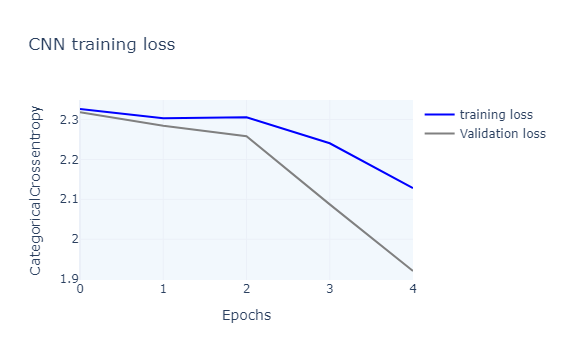

In [153]:
#visualize training loss & validation loss which indecates there is no overfitting
fig = go.Figure()
epochs = 5
fig.add_trace(go.Scatter(x=np.arange(0,epochs,1),
y=history.history['loss'],
mode='lines',
name=f'training loss',
marker_size=3,
line_color='blue'))
fig.add_trace(go.Scatter(x=np.arange(0, epochs, 1),
                         y=history.history['val_loss'],
                         mode='lines',
                         name=f'Validation loss',
                         line_color='grey'))
fig.update_layout(
                  title="CNN training loss",
                  xaxis_title="Epochs",
                  yaxis_title=f"CategoricalCrossentropy")
                  
fig.update_layout({'plot_bgcolor': '#f2f8fd' , 
                   'paper_bgcolor': 'white',}, 
                   template='plotly_white')

# Visualize training&validation accuracy

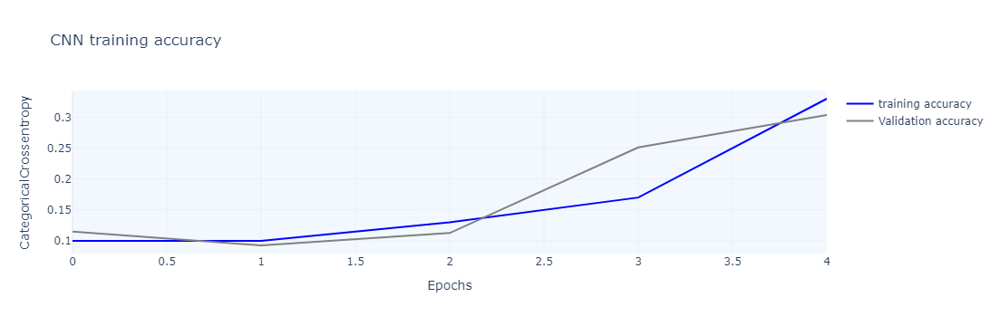

In [154]:
#visualize training accuracy & validation accuracy
fig = go.Figure()
epochs = 5
fig.add_trace(go.Scatter(x=np.arange(0,epochs,1),
y=history.history['categorical_accuracy'],
mode='lines',
name=f'training accuracy',
marker_size=3,
line_color='blue'))
fig.add_trace(go.Scatter(x=np.arange(0, epochs, 1),
                         y=history.history['val_categorical_accuracy'],
                         mode='lines',
                         name=f'Validation accuracy',
                         line_color='grey'))
fig.update_layout(
                    title="CNN training accuracy",
                  xaxis_title="Epochs",
                  yaxis_title=f"CategoricalCrossentropy")
                  
fig.update_layout({'plot_bgcolor': '#f2f8fd' , 
                   'paper_bgcolor': 'white',}, 
                   template='plotly_white')

# Test Model to new data

In [155]:
x_test.info()
x_test.tail(8)
samples= x_test.sample(n=5)

<class 'pandas.core.frame.DataFrame'>
Index: 3000 entries, 12840 to 8522
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Image   3000 non-null   object
 1   Label   3000 non-null   object
dtypes: object(2)
memory usage: 70.3+ KB


In [156]:
model = load_model('./handG_R.h5',compile=True)